In [2]:
import zipfile

with zipfile.ZipFile('CK+48.zip', 'r') as zip_ref:
    zip_ref.extractall('.')  # Extract to the current directory

print("Dataset extracted successfully!")

Dataset extracted successfully!


# **2. Image Pre-processing**

In [3]:
import cv2
import os
import numpy as np

# Create a directory to store pre-processed images
os.makedirs('Preprocessed', exist_ok=True)

def preprocess_images(input_dir, output_dir, target_size=(128, 128), equalize_hist=False):
    for root, dirs, files in os.walk(input_dir):
        for filename in files:
            if filename.endswith('.png'):
                img_path = os.path.join(root, filename)
                try:
                    # Read the image
                    img = cv2.imread(img_path)

                    # A) Convert to grayscale
                    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

                    # B) Resize
                    resized_img = cv2.resize(gray_img, target_size)

                    # C) Normalize pixel values (0-1)
                    normalized_img = resized_img / 255.0

                    # D) Optional histogram equalization
                    if equalize_hist:
                        normalized_img = cv2.equalizeHist(np.uint8(normalized_img * 255)) / 255.0

                    # Reconstruct subdirectory structure inside the output directory
                    rel_path = os.path.relpath(img_path, input_dir)
                    save_path = os.path.join(output_dir, rel_path)
                    os.makedirs(os.path.dirname(save_path), exist_ok=True)

                    # Save the preprocessed image
                    cv2.imwrite(save_path, np.uint8(normalized_img * 255))  # Save as uint8
                except Exception as e:
                    print(f"Error processing {img_path}: {e}")

# Example usage
input_directory = 'CK+48'
output_directory = 'Preprocessed'
preprocess_images(input_directory, output_directory, equalize_hist=True)
print("Image preprocessing complete!")

Image preprocessing complete!


# **3. Feature Extraction**

**SIFT (Scale-Invariant Feature Transform)**

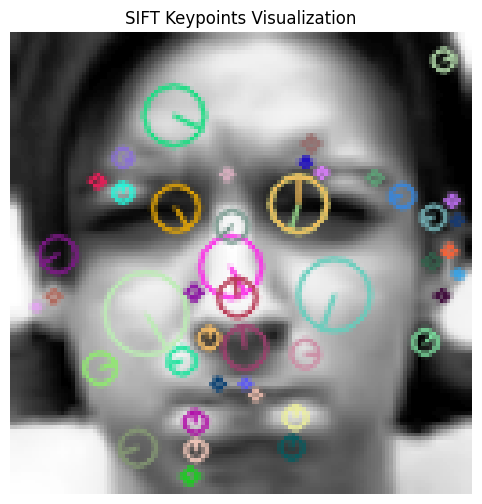

In [4]:
import cv2
import matplotlib.pyplot as plt

# Load grayscale image
img_path = '/content/Preprocessed/anger/S010_004_00000017.png'
img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

# Initialize SIFT detector
sift = cv2.SIFT_create()

# Detect keypoints and descriptors
keypoints, descriptors = sift.detectAndCompute(img, None)

# Draw keypoints
img_sift = cv2.drawKeypoints(img, keypoints, None,
                             flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display
plt.figure(figsize=(8, 6))
plt.imshow(img_sift, cmap='gray')
plt.title("SIFT Keypoints Visualization")
plt.axis('off')
plt.show()


**HOG (Histogram of Oriented Gradients)**

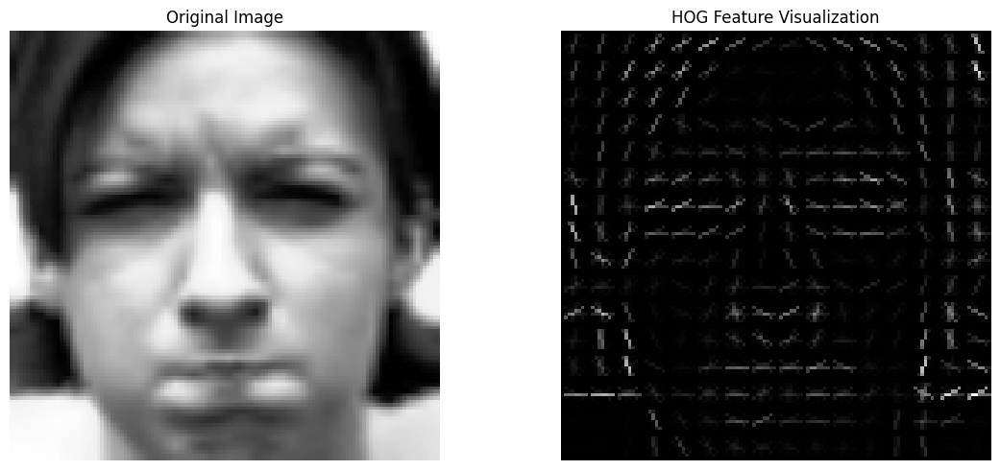

In [5]:
from skimage.feature import hog
import numpy as np

# Compute HOG features and visualization image
features, hog_image = hog(img,
                          orientations=9,
                          pixels_per_cell=(8, 8),
                          cells_per_block=(2, 2),
                          transform_sqrt=True,
                          visualize=True,
                          feature_vector=True)

# Show original and HOG image
plt.figure(figsize=(12, 5))

# Original
plt.subplot(1, 2, 1)
plt.imshow(img, cmap='gray')
plt.title("Original Image")
plt.axis('off')

# HOG
plt.subplot(1, 2, 2)
plt.imshow(hog_image, cmap='gray')
plt.title("HOG Feature Visualization")
plt.axis('off')

plt.tight_layout()
plt.show()

**Choose *best* Alg:** Overall SIFT highlights all keypoints while HOG is more of an outline of the face and features are not very clear

# **4. Model Training**

In [6]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
import joblib

# Define emotion labels and mapping
emotion_labels = ['anger', 'contempt', 'disgust', 'fear', 'happy', 'sadness', 'surprise']
label_to_index = {emotion: i for i, emotion in enumerate(emotion_labels)}

X, y = [], []
preprocessed_dir = 'Preprocessed'

# Load images and extract HOG features
for emotion in emotion_labels:
    emotion_path = os.path.join(preprocessed_dir, emotion)
    if not os.path.exists(emotion_path):
        print(f"WARNING: Directory '{emotion}' not found — skipping.")
        continue

    for file in os.listdir(emotion_path):
        img_path = os.path.join(emotion_path, file)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

        if img is not None:
            features = hog(img, orientations=9, pixels_per_cell=(8, 8),
                           cells_per_block=(2, 2), block_norm='L2-Hys')
            X.append(features)
            y.append(label_to_index[emotion])

X = np.array(X)
y = np.array(y)

print(f"Loaded {len(X)} samples.")

# Split data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# Train SVM classifier
clf = SVC(kernel='linear', probability=True)
clf.fit(X_train, y_train)

# Save the trained model
joblib.dump(clf, "emotion_classifier.pkl")
print("Trained model saved as 'emotion_classifier.pkl'")


Loaded 981 samples.
Trained model saved as 'emotion_classifier.pkl'


# **5. Evaluation**

Accuracy: 100.00%

Classification Report:
              precision    recall  f1-score   support

       anger       1.00      1.00      1.00        27
    contempt       1.00      1.00      1.00        11
     disgust       1.00      1.00      1.00        35
        fear       1.00      1.00      1.00        15
       happy       1.00      1.00      1.00        42
     sadness       1.00      1.00      1.00        17
    surprise       1.00      1.00      1.00        50

    accuracy                           1.00       197
   macro avg       1.00      1.00      1.00       197
weighted avg       1.00      1.00      1.00       197



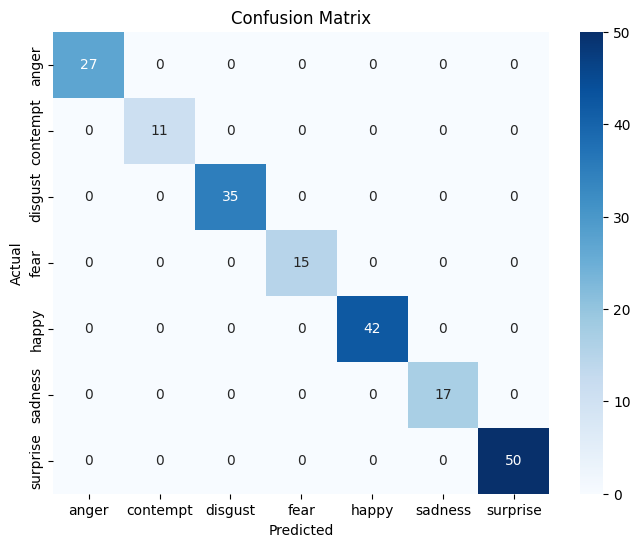

In [7]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import seaborn as sns

# Predict on test set
y_pred = clf.predict(X_test)

# Accuracy score
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")

# Classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=emotion_labels))

# Confusion matrix heatmap
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='d',
            xticklabels=emotion_labels, yticklabels=emotion_labels)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()


# **6. Real-time Emotion Prediction**

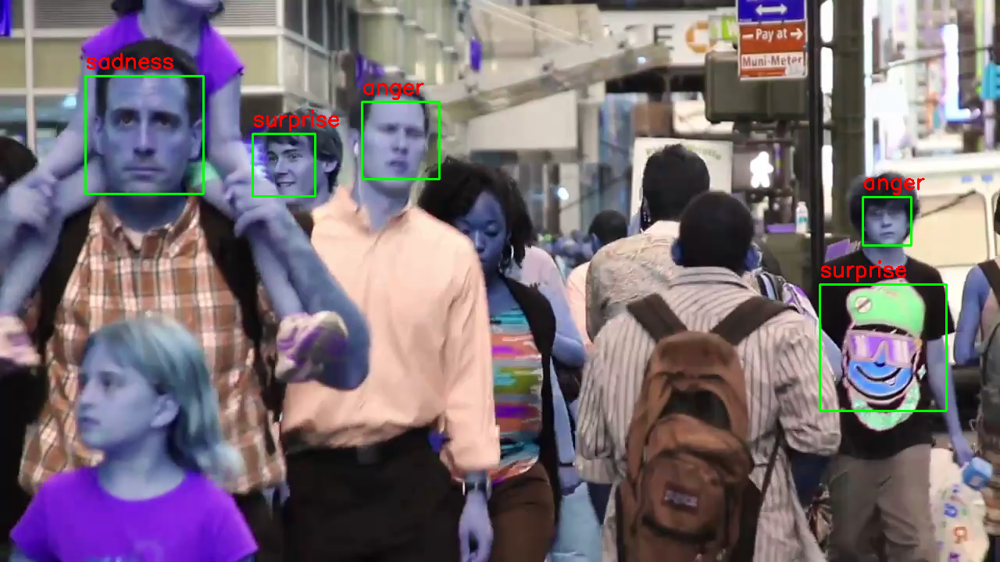

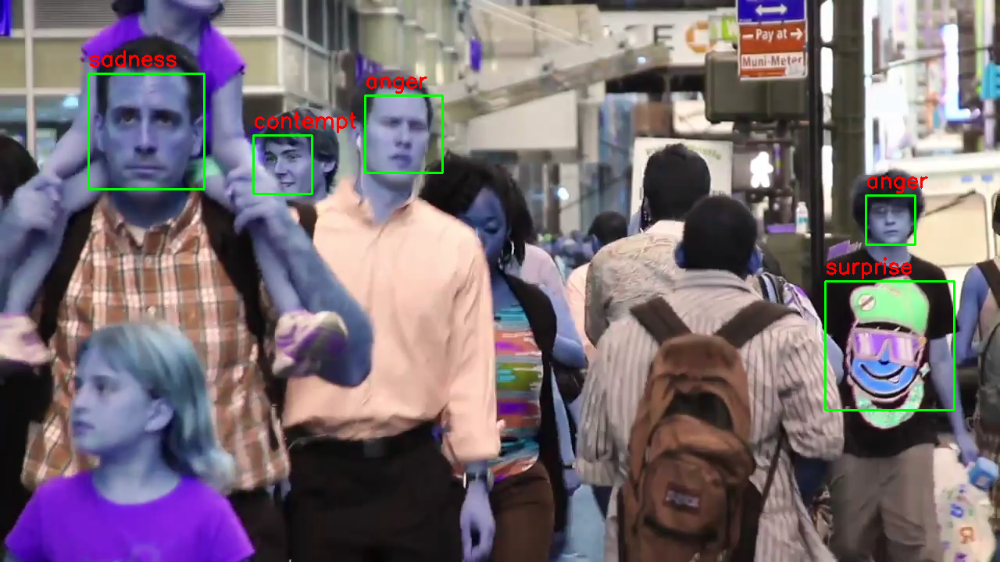

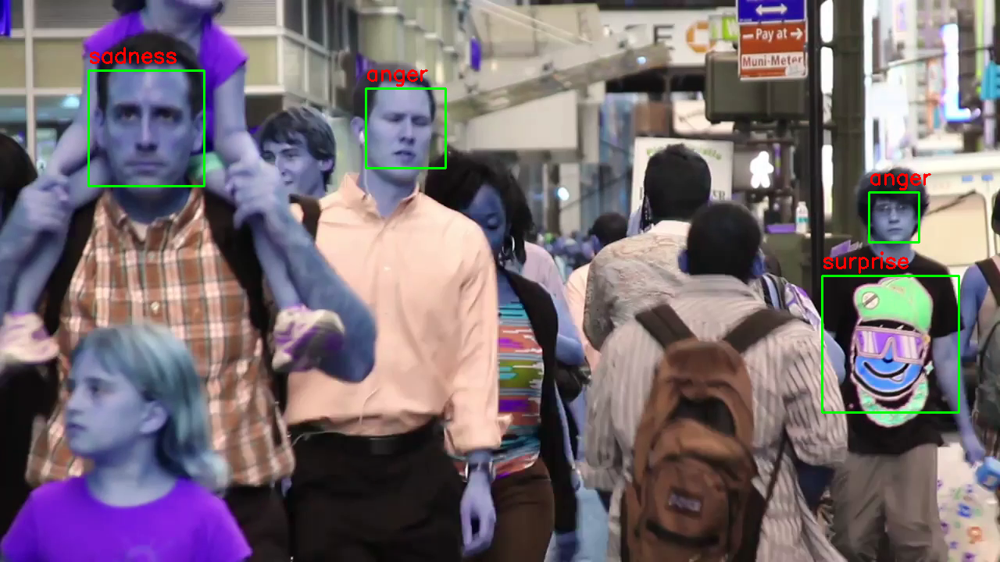

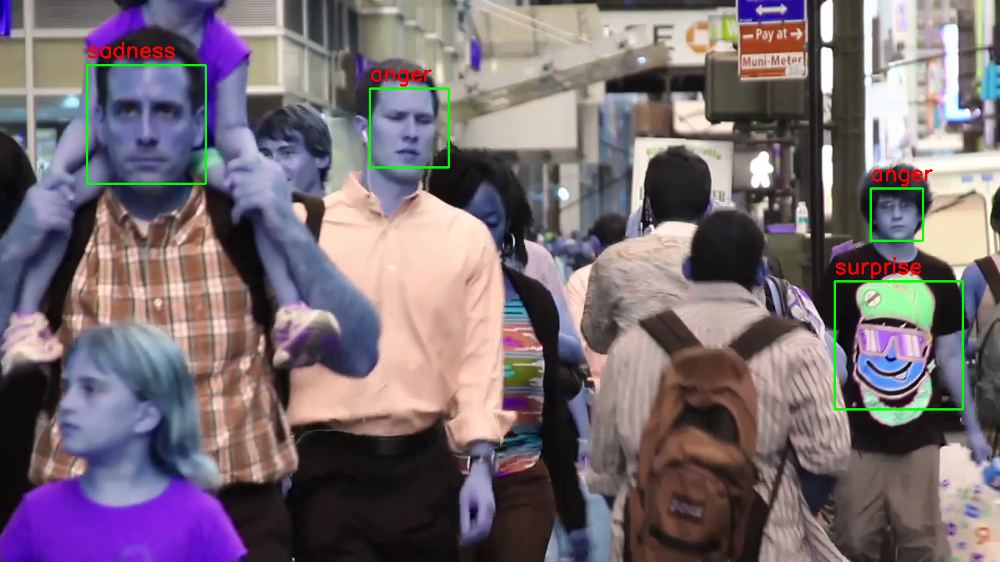

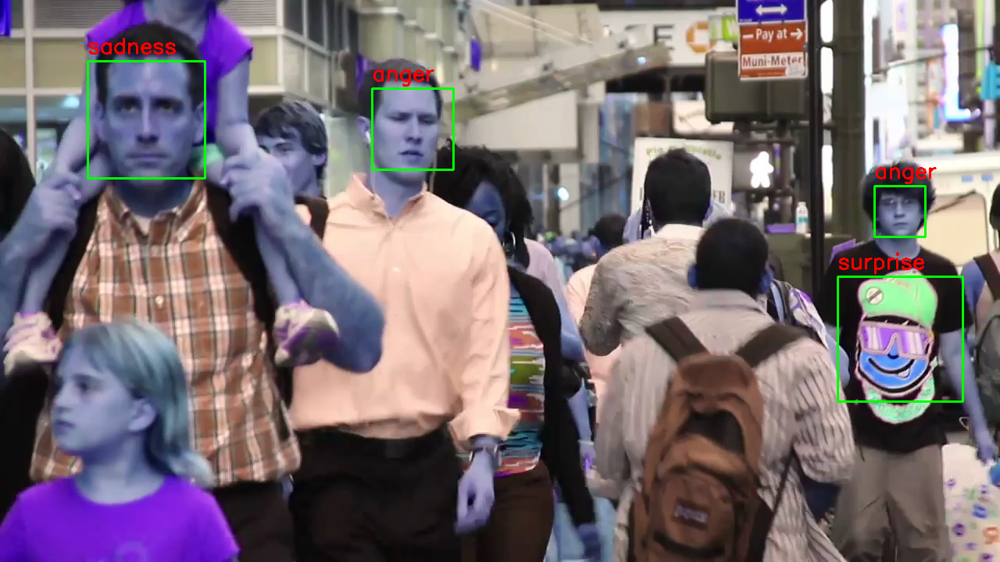

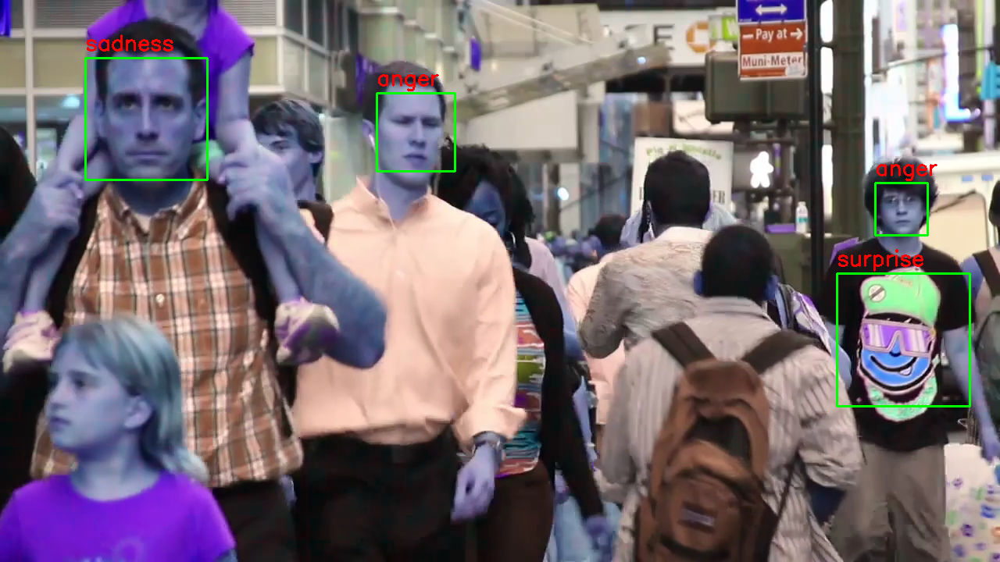

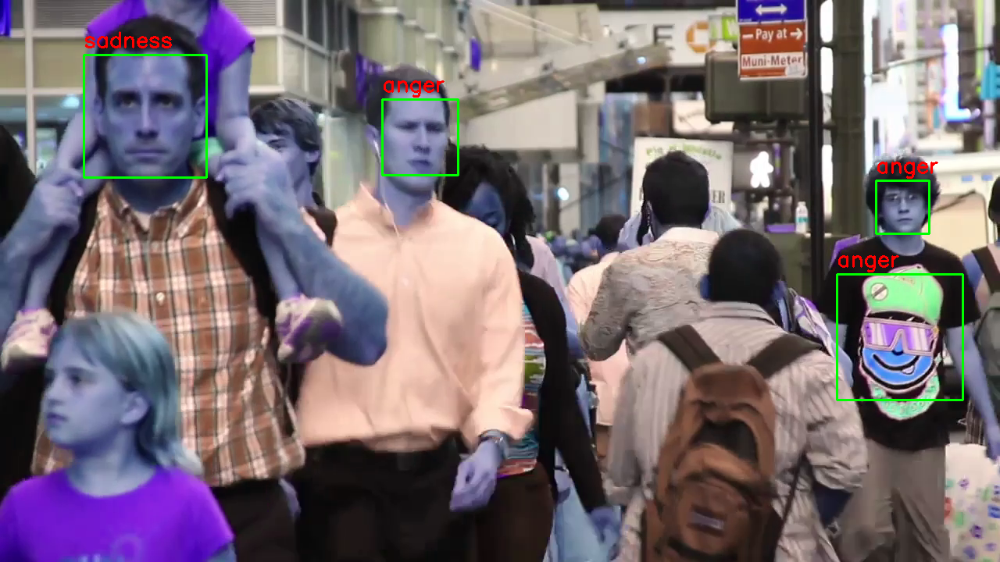

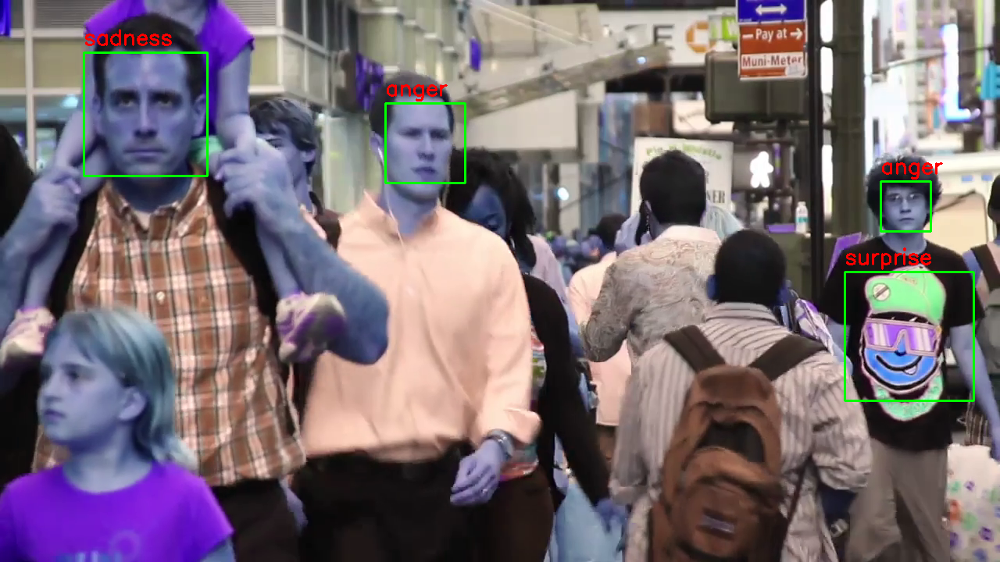

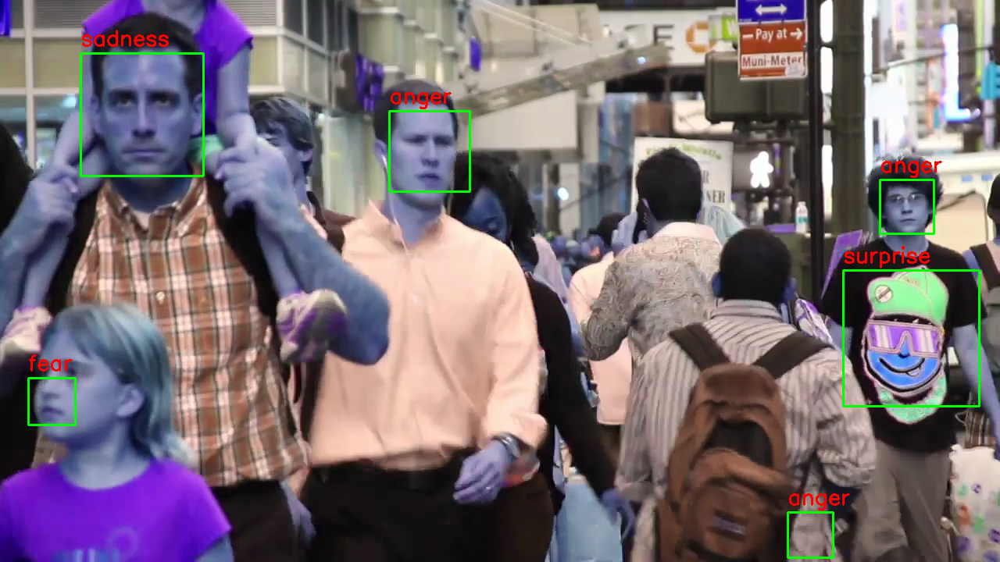

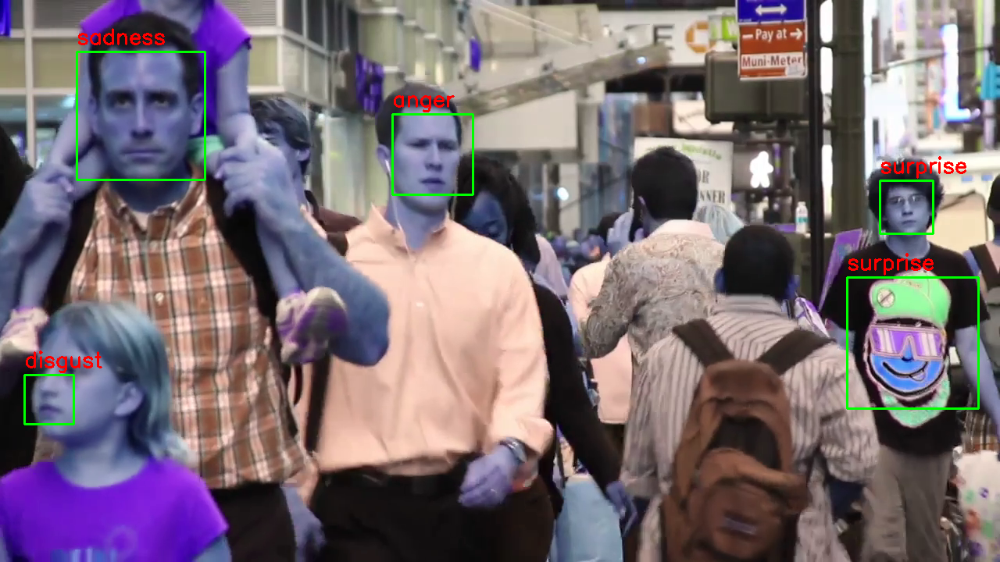

In [8]:
# Step 6.1: Import the Colab display function for showing frames
from google.colab.patches import cv2_imshow

# Step 6.2: Load the Haar Cascade face detector (face detection method)
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Step 6.3: Load the trained SVM model from Step 4 using joblib
model = joblib.load("emotion_classifier.pkl")

# Step 6.4: Define the emotion labels in the same order used during training
emotion_labels = ['anger', 'contempt', 'disgust', 'fear', 'happy', 'sadness', 'surprise']

# Step 6.5: Load the video file (YouTube pedestrian video)
video_path = "/content/Crowd walking forward NYC B-RollM.mp4"
cap = cv2.VideoCapture(video_path)

# Step 6.6: Limit how many frames are processed in Colab to avoid display issues
frame_count = 0
max_frames = 10  # This can be increased or removed for local testing

# Step 6.7: Process the video frame-by-frame
while cap.isOpened() and frame_count < max_frames:
    # Read the current frame from the video
    ret, frame = cap.read()
    if not ret:
        break

    # Step 6.8: Convert the frame to grayscale (preprocessing requirement)
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Step 6.9: Detect faces in the grayscale frame using Haar Cascade
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.3, minNeighbors=5)

    # Step 6.10: Process each detected face
    for (x, y, w, h) in faces:
        # Step 6.11: Extract the face region from the image (cropping)
        face_img = gray[y:y+h, x:x+w]

        # Step 6.12: Resize the face to 128x128 (same size used in training)
        resized_face = cv2.resize(face_img, (128, 128))

        # Step 6.13: Normalize pixel values to the [0, 1] range
        normalized_face = resized_face / 255.0

        # Step 6.14: Extract HOG features from the preprocessed face
        features = hog(normalized_face, orientations=9, pixels_per_cell=(8, 8),
                       cells_per_block=(2, 2), block_norm='L2-Hys')

        # Step 6.15: Predict the emotion label using the trained classifier
        prediction = model.predict([features])[0]
        predicted_emotion = emotion_labels[prediction]

        # Step 6.16: Draw a rectangle around the detected face
        cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 255, 0), 2)

        # Step 6.17: Overlay the predicted emotion label on the frame
        cv2.putText(frame, predicted_emotion, (x, y - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)

    # Step 6.18: Convert frame to RGB for display in Colab
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    # Step 6.19: Display the annotated frame in Colab
    cv2_imshow(frame_rgb)

    # Increment the frame counter
    frame_count += 1

# Step 6.20: Release the video capture object
cap.release()
